# 关于新版训练代码 02/17/2022

1. 训练集
    1. winner_poses 原本的skeleton减去了bbox中心
    2. loser_poses 原本的skeleton减去了bbox中心
    3. dists 原本的bbox中心差
    2. 坐标是屏幕坐标系除以1280，720以后的，直接从video_info.npy 提取的
    3. 如果赢家是右边，则反转，保证赢家在左边，输家在右边
    4. Dist是用赢家减输家 （x应该是负的）
    5. 一个视频提取了20帧pose
2. 做了shuffle 和normalization

# to-do 
[v] centered the pose 

[v] draw the prediction around the center

[v] Result == 1 的时候，为什么不需要反转照片呢？
 因为loser没有用1-自身
 
 
“#loser_tensor_org_restored[:, :, 0] = 1 - loser_tensor_org_restored[:, :, 0]”




In [4]:
import sys
sys.path.append('../Scripts/')
sys.path.append('../Scripts/Datasets')
sys.path.append('../Scripts/Models')


from Models.interaction_generator import train_fight2, Fight2
from Models.model_helpers import prepare_nd_to_torch, restore_torch_to_nd
from Models.loss_function import compare_two_pose
from Datasets.crop_pose_image import find_pose_centers, find_bbox, find_pose_centers, get_pose_centered_crop
from Datasets.extract_videoinfo_poses import mkdir
from BodyframeHelper import draw_keypoints

import torch
import cv2
import glob
import numpy as np
import matplotlib.pyplot as plt
device = 'cuda:0'

In [5]:
def find_bbox(keypoints):
    keypoints_copy = keypoints
    to_delete = []
    cnt = 0
    for kp in keypoints_copy:
        # print(kp.shape)x
        pos = (kp[0], kp[1])
        if (pos == (0, 0)) or (pos == (1, 0)):
            to_delete.append(cnt)
        cnt += 1
    keypoints_copy = np.delete(keypoints_copy, to_delete, 0)
    return [min(keypoints_copy[:, 0]), max(keypoints_copy[:, 0]), min(keypoints_copy[:, 1]), max(keypoints_copy[:, 1])]

def get_dist_grid(dist_ref, grid_dim=[30, 1], offsets=[0, 0]):
    dist_grid = torch.zeros([grid_dim[0], grid_dim[1], 2]).to(device)
    offsetX = torch.tensor([offsets[0], 0.0]).float().to(device)
    offsetY = torch.tensor([0.0, offsets[1]]).float().to(device)
    for i in range(grid_dim[0]):
        for j in range(grid_dim[1]):
            dist_grid[i, j, :] = dist_ref + \
                                 offsetX * (i - int((grid_dim[0]) / 2)) + \
                                 offsetY * (j - int((grid_dim[1]) / 2))

    return dist_grid

def bbox_center(bbox):
    return ((bbox[0] + bbox[1])/2, (bbox[2] + bbox[3])/2)

def bbox_dists(bbox1, bbox2):
    return (np.array(bbox_center(bbox1)) - np.array(bbox_center(bbox2)))

In [8]:
### Load the entire dataset

npys = glob.glob(f"../Results/Datasets/olympic_batch_2v4/npys/*")
winner_poses = []
winner_centers = []
loser_poses = []
loser_centers = []
dists = []
results = []
frame_indices = []
for v in range(len(npys)):
    npy = np.load(npys[v])
    result = npy['round_result']
    score_moment = npy['decisive_frame_index']
    skeleton_frames = npy['skeleton_frames']
    if (score_moment - 10) > 0 and (score_moment + 10) <= len(skeleton_frames):
        flag = True
        for i in range(score_moment - 10, (score_moment + 10)):
            if len(skeleton_frames[i]) != 2:
                flag = False
        if flag == True:
            for i in range(score_moment - 10, (score_moment + 10)):
                winner_pose = np.array(skeleton_frames[i][result])
                loser_pose = np.array(skeleton_frames[i][1-result])
    #             print(loser_pose, winner_pose.shape)
                # when the right side wins, flip both players across the screen
                if result == 1:
                    loser_pose[:, 0] = 1 - loser_pose[:, 0] 
                    winner_pose[:, 0] = 1 - winner_pose[:, 0]
                winner_bbox = find_bbox(winner_pose)
                loser_bbox = find_bbox(loser_pose)
                dists.append(bbox_dists(winner_bbox, loser_bbox))
                
                winner_center = [(winner_bbox[0] + winner_bbox[1])/2, (winner_bbox[2] + winner_bbox[3])/2, 0]
                loser_center = [(loser_bbox[0] + loser_bbox[1])/2, (loser_bbox[2] + loser_bbox[3])/2, 0]
                winner_centers.append(winner_center)
                loser_centers.append(loser_center)
#                 print(winner_pose, winner_center)                
                winner_pose = winner_pose - winner_center
                loser_pose = loser_pose - loser_center
#                 print(winner_pose)
                winner_poses.append(winner_pose)
                loser_poses.append(loser_pose)
                results.append(result)
                
                frame_indices.append([int(npys[v].split('/')[-1].split('_')[0]), i])

dists = np.array(dists)
winner_poses = np.array(winner_poses)
loser_poses = np.array(loser_poses)
frame_indices = np.array(frame_indices)
winner_centers = np.array(winner_centers)
loser_centers = np.array(loser_centers)
results = np.array(results)

print(dists.shape)
print(winner_poses.shape)
print(loser_poses.shape)
print(frame_indices.shape)
print(frame_indices)

(5400, 2)
(5400, 25, 3)
(5400, 25, 3)
(5400, 2)
[[402  79]
 [402  80]
 [402  81]
 ...
 [262 262]
 [262 263]
 [262 264]]


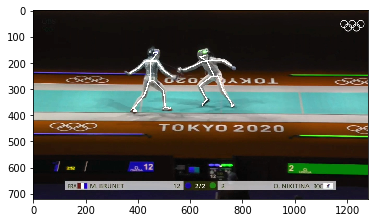

In [9]:
begin = 10
(video_index, frame_count) = frame_indices[begin]
WORK_PATH='../Results'
image = cv2.imread(f"{WORK_PATH}/Datasets/olympic_batch_2v4/video_frames/{video_index:05d}/{frame_count:05d}.jpg")
plt.imshow(image)
image = draw_keypoints(image, (winner_poses[begin: begin + 1].reshape(25,3) + winner_centers[begin: begin + 1]) * np.array([1280, 720, 1]), draw_confidence = False)
image = draw_keypoints(image, (loser_poses[begin: begin + 1].reshape(25,3)+ loser_centers[begin: begin + 1]) * np.array([1280, 720, 1]), draw_confidence = False)
plt.imshow(image)

In [11]:
### Prepare Dataset

# Pick only parts of the dataset
pick_indices = np.array([np.array(range(int(winner_poses.shape[0]/20))) * 20 + i for i in range(5, 15)])
pick_indices = np.transpose(pick_indices).flatten()

# Filter out the picked dataset
winner_poses_used = winner_poses[pick_indices]
loser_poses_used = loser_poses[pick_indices]
dists_used = dists[pick_indices]
frame_indices_used = frame_indices[pick_indices]
winner_centers_used = winner_centers[pick_indices]
loser_centers_used = loser_centers[pick_indices]
results_used = results[pick_indices]
SHOULD_SHUFFLE = True

# Shuffle the combined tensor
shuffle_indices = np.arange(winner_poses_used.shape[0])
if SHOULD_SHUFFLE:
    np.random.shuffle(shuffle_indices)

winner_poses_shuffled = winner_poses_used[shuffle_indices]
loser_poses_shuffled = loser_poses_used[shuffle_indices]
dists_used_shuffled = dists_used[shuffle_indices]

# Create tensors & normailization 
winner_std, winner_mean, winner_tensor = prepare_nd_to_torch(winner_poses_shuffled)
loser_std, loser_mean, loser_tensor = prepare_nd_to_torch(loser_poses_shuffled)
# dist_std, dist_mean, dist_tensor = prepare_nd_to_torch(dists_used_shuffled)

dists_tensor = torch.from_numpy(dists_used_shuffled).to(device)
dist_std, dist_mean = torch.std_mean(dists_tensor, dim=0)
dists_tensor = (dists_tensor - dist_mean) / dist_std

404


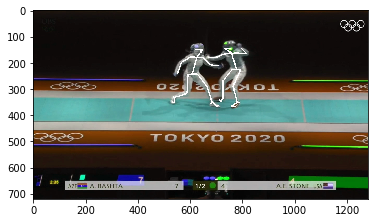

In [13]:
### Test Shuffuled Dataset

begin = 160
idx = shuffle_indices[begin]
print(idx)
(video_index, frame_count) = frame_indices_used[idx]

image = cv2.imread(f"{WORK_PATH}/Datasets/olympic_batch_2v4/video_frames/{video_index:05d}/{frame_count:05d}.jpg")
plt.imshow(image)
image = draw_keypoints(image, (winner_poses_shuffled[begin: begin + 1].reshape(25,3) + winner_centers_used[idx:idx+1]) * np.array([1280, 720, 1]), draw_confidence = False)
image = draw_keypoints(image, (loser_poses_shuffled[begin: begin + 1].reshape(25,3)+ loser_centers_used[idx:idx+1]) * np.array([1280, 720, 1]), draw_confidence = False)
plt.imshow(image)

In [16]:
### Train Model

IDENTIFIER = "2.0_Interaction_Generator"
WORK_PATH= '../Results'
epochs = 1500
model_save_dir = f"{WORK_PATH}/Models/{IDENTIFIER}"
mkdir(model_save_dir)
visualization_save_dir = f"{model_save_dir}/recon_results"
mkdir(visualization_save_dir)
# Train & Save the model
fight_model = train_fight2([loser_tensor, winner_tensor], dists_tensor,
                           loss_func=compare_two_pose,
                           epoch=epochs,
                           batch_size=32,
                           lr=0.03,
                           l2_lamda=0.001,
                           save_models=True,
                           save_path=f"{model_save_dir}/fight_")


Epoch: 00001, Training Err:0.8517
Epoch: 00150, Training Err:0.1313
Epoch: 00300, Training Err:0.1319
Epoch: 00450, Training Err:0.1072
Epoch: 00600, Training Err:0.1563
Epoch: 00750, Training Err:0.1085
Epoch: 00900, Training Err:0.1091
Epoch: 01050, Training Err:0.1055
Epoch: 01200, Training Err:0.1056
Epoch: 01350, Training Err:0.1034
Epoch: 01500, Training Err:0.1080


In [17]:
### Read 10 model checkpoints

E = [1]
for i in range(10):
    E.append(int(epochs* (0.1 * i + 0.1)))
print(E)
model_save_dir = f"{WORK_PATH}/Models/{IDENTIFIER}"
mkdir(model_save_dir)
visualization_save_dir = f"{model_save_dir}/recon_results"
mkdir(visualization_save_dir)
models = [torch.load(f"{model_save_dir}/fight_{(e):04d}.pth") for e in E]

[1, 150, 300, 450, 600, 750, 900, 1050, 1200, 1350, 1500]





0 2676 272 126
0 1059 266 120
0 2604 393 35
0 1824 56 336
0 602 293 62
0 1468 29 344
0 383 65 164
0 1455 112 27
0 1050 266 111
0 1962 379 509
0 2666 169 553
0 1305 235 206
0 956 182 791
0 1156 281 81
0 1832 352 127
0 1180 77 134
0 1308 235 209
0 604 293 64
0 1900 375 210
0 2339 250 109
0 2567 395 53
0 2660 169 547


/home/weihao/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:63: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


0 2658 90 309
0 2262 107 470
0 2459 365 541
0 1459 112 31
0 2542 320 135
0 1165 40 62
0 478 358 100
0 750 321 171
0 1976 360 58
0 260 94 303
0 40 126 258
0 795 109 65
0 403 66 183
0 696 401 70
0 2554 121 188
0 1755 396 128
0 1428 114 338
0 1967 379 514
0 1249 270 139
0 2005 444 271
0 827 302 231
0 2191 275 286
0 1477 55 500
0 2059 424 639
0 2625 45 154
0 152 208 721
0 740 8 122
0 1220 295 208
0 1137 285 518
0 640 329 194
0 2450 365 532
0 887 326 66
0 1657 125 352
0 2648 355 525
0 1656 125 351
0 2216 149 416
0 2527 312 140
0 700 436 270
0 1056 266 117
0 24 220 120
0 219 257 99
0 96 408 853
0 2494 224 185
0 987 331 320
0 1584 71 263
0 1277 93 155
0 824 302 228
0 2519 102 73
0 2543 320 136
0 1173 301 84
0 1577 116 59
0 288 118 112
0 1112 100 105
0 2452 365 534
0 242 113 136
0 2088 80 303
0 2606 393 37
0 1252 128 794
0 1857 234 29
0 1362 288 69
0 607 293 67
0 1586 71 265
0 1138 285 519
0 280 118 104
0 432 134 548
0 2008 444 274
0 1911 108 111
0 563 10 35
0 143 38 161
0 1717 110 139
0 1162 

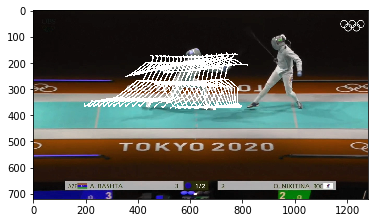

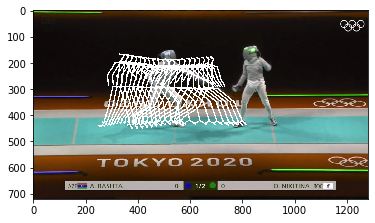

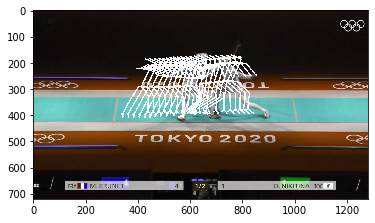

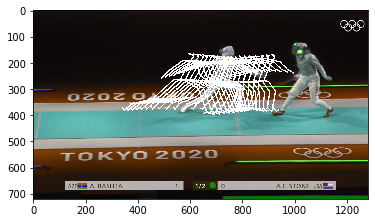

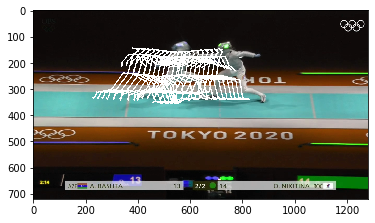

...

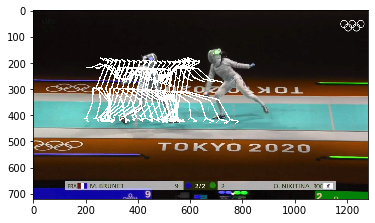

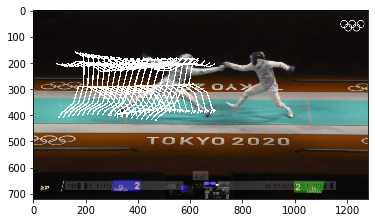

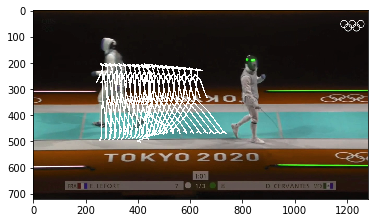

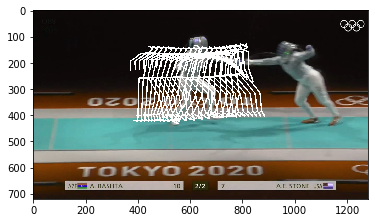

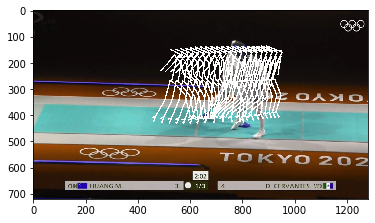

In [19]:
grid_dim = [20, 1]
offsets = [0.015, 0.0]
save_path = f"{visualization_save_dir}/combat_synthesis"  # {video_index:05d}/"
mkdir(save_path)
for fight_model in models[8:9]:
    for i in range(0,100):
        idx = shuffle_indices[i]
        
        loser_pose_tensor = loser_tensor[i:i + 1]
        dist_grid = get_dist_grid(torch.from_numpy(dists_used[idx]).to(device), grid_dim=grid_dim, offsets=offsets)
        dist_grid_normalized = (dist_grid - dist_mean)/dist_std
        winner_tensor_recon_restored_multi = []
        for x in range(grid_dim[0]):
            for y in range(grid_dim[1]):
                dist = dist_grid_normalized[x, y].reshape(1, 2)
                winner_tensor_recon = fight_model(loser_pose_tensor.float(), dist.float())
                winner_tensor_recon_restored = restore_torch_to_nd(winner_tensor_recon, winner_std, winner_mean)
                winner_tensor_recon_restored_multi.append(winner_tensor_recon_restored)
        winner_tensor_recon_restored_multi = np.stack(winner_tensor_recon_restored_multi)

        loser_tensor_org_restored = restore_torch_to_nd(loser_pose_tensor, loser_std, loser_mean)
    #     loser_tensor_org_restored[:, :, 0] = 1 - loser_tensor_org_restored[:, :, 0]
        winner_tensor_org_restored = restore_torch_to_nd(winner_tensor[i:i + 1], winner_std, winner_mean)


        (video_index, frame_count) = frame_indices_used[idx]
#         print((video_index, frame_count))
        original_image = cv2.imread(f"{WORK_PATH}/Datasets/olympic_batch_2v4/video_frames/{video_index:05d}/{frame_count:05d}.jpg")
        print(results[idx], idx, video_index, frame_count)
#         if results[idx] == 1:
#             original_image = cv2.flip(original_image, 1)
# # Show original image       
#         plt.figure()
#         plt.imshow(original_image)    

# # Show original winner loser image
#         image = draw_keypoints(np.copy(original_image), (winner_poses_used[idx: idx + 1].reshape(25,3) + winner_centers_used[idx:idx+1]) * np.array([1280, 720, 1]), draw_confidence = False)
#         image = draw_keypoints(image, (loser_poses_used[idx: idx + 1].reshape(25,3) + loser_centers_used[idx:idx+1]) * np.array([1280, 720, 1]), draw_confidence = False)
#         plt.figure()
#         plt.imshow(image)

# # Show loser-restored image, check about the std and mean
#         loser_tensor_org_restored_screen_space = (loser_tensor_org_restored.reshape(25, -1)+ loser_centers_used[idx:idx+1]) * np.array([1280,720, 1.0])
#         image = draw_keypoints(np.copy(original_image), loser_tensor_org_restored_screen_space.reshape(25,-1), draw_confidence = False)
#         plt.figure()
#         plt.imshow(image)


        
# # Show multiple predictions
        image = np.copy(original_image)
        image = draw_keypoints(image, (winner_poses_used[idx: idx + 1].reshape(25,3) + winner_centers_used[idx:idx+1]) * np.array([1280, 720, 1]), draw_confidence = False)


        winner_centers_aggregated = loser_centers_used[idx, 0:2] + dist_grid.detach().cpu().numpy()
#         winner_center_original = loser_centers_used[idx, 0:2] - dists_used[idx]
#         print(winner_centers_aggregated, winner_center_original)
        generated_winner_pose_screen_space = (winner_tensor_recon_restored_multi.reshape(-1,25, 2) + winner_centers_aggregated) * np.array([1280,720])

        for didx in range(grid_dim[0]):
#             print(generated_winner_pose_screen_space[didx])
            image = draw_keypoints(image, generated_winner_pose_screen_space[didx].reshape(25,-1) , draw_confidence = False)
        plt.figure()
        plt.imshow(image)
        
        cv2.imwrite(save_path + f"/{video_index:05d}_{frame_count:05d}_{offsets}_{grid_dim}.jpg", image)

In [20]:
# find the idx of given video and frame
video_idx = 294
frame_idx = 547
for idx_t in range(frame_indices_used.shape[0]):
    if (frame_indices_used[idx_t, :] ==  (video_idx, frame_idx)).all(): 
        idx = idx_t
        print(idx_t)
        
# find i in the shuffle_indices        
i = int(np.argwhere(shuffle_indices == idx))
print(i, idx)

2408
480 2408


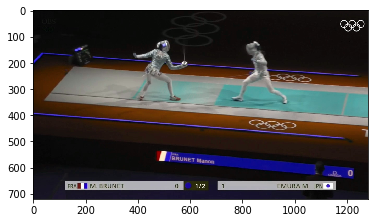

In [22]:
original_image = cv2.imread(f"{WORK_PATH}/Datasets/olympic_batch_2v4/video_frames/{video_idx:05d}/{frame_idx:05d}.jpg")
cv2.imwrite(f"{save_path}/{video_index:05d}_{frame_count:05d}.jpg", original_image)
plt.figure()
plt.imshow(original_image)


In [14]:
generated_winner_pose_screen_space[didx].shape

(25, 2)

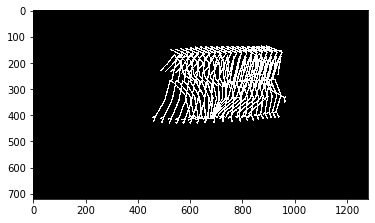

In [24]:
fight_model = models[8]

grid_dim = [20, 1]
offsets = [0.015, 0.0]
save_path = f"../Results/pSp_translation/{video_idx:05d}_{frame_idx:05d}"  # {video_index:05d}/"
mkdir(save_path)
mkdir(f"{save_path}/crops/")
mkdir(f"{save_path}/replaced_crops/")
      
loser_pose_tensor = loser_tensor[i:i + 1]
dist_grid = get_dist_grid(torch.from_numpy(dists_used[idx]).to(device), grid_dim=grid_dim, offsets=offsets)
dist_grid_normalized = (dist_grid - dist_mean)/dist_std
winner_tensor_recon_restored_multi = []
for x in range(grid_dim[0]):
    for y in range(grid_dim[1]):
        dist = dist_grid_normalized[x, y].reshape(1, 2)
        winner_tensor_recon = fight_model(loser_pose_tensor.float(), dist.float())
        winner_tensor_recon_restored = restore_torch_to_nd(winner_tensor_recon, winner_std, winner_mean)
        winner_tensor_recon_restored_multi.append(winner_tensor_recon_restored)
winner_tensor_recon_restored_multi = np.stack(winner_tensor_recon_restored_multi)

loser_tensor_org_restored = restore_torch_to_nd(loser_pose_tensor, loser_std, loser_mean)
#     loser_tensor_org_restored[:, :, 0] = 1 - loser_tensor_org_restored[:, :, 0]
winner_tensor_org_restored = restore_torch_to_nd(winner_tensor[i:i + 1], winner_std, winner_mean)

(video_index, frame_count) = frame_indices_used[idx]


# # Show multiple predictions
# image = draw_keypoints(image, (winner_poses_used[idx: idx + 1].reshape(25,3) + winner_centers_used[idx:idx+1]) * np.array([1280, 720, 1]), draw_confidence = False)


winner_centers_aggregated = loser_centers_used[idx, 0:2] + dist_grid.detach().cpu().numpy()
#         winner_center_original = loser_centers_used[idx, 0:2] - dists_used[idx]
#         print(winner_centers_aggregated, winner_center_original)
generated_winner_pose_0_1_space = winner_tensor_recon_restored_multi.reshape(-1,25, 2) + winner_centers_aggregated

image_all = np.zeros(shape = [720, 1280, 3], dtype=np.uint8)
for didx in range(grid_dim[0]):
#             print(generated_winner_pose_screen_space[didx])
    image = np.zeros(shape = [720, 1280, 3], dtype=np.uint8)
    image = draw_keypoints(image, generated_winner_pose_screen_space[didx].reshape(25,-1) , draw_confidence = False)
    image_all = draw_keypoints(image_all, generated_winner_pose_screen_space[didx].reshape(25,-1) , draw_confidence = False)
    
    crop, _, _, _ = get_pose_centered_crop(image, generated_winner_pose_0_1_space[didx])
#     plt.figure()
#     plt.imshow(crops[0])
    cv2.imwrite(f"{save_path}/crops/{video_index:05d}_{frame_count:05d}_{offsets}_{grid_dim}_{didx:04d}_crop.jpg", crop)    
#     plt.figure()
#     plt.imshow(image)
    cv2.imwrite(f"{save_path}/{video_index:05d}_{frame_count:05d}_{offsets}_{grid_dim}_{didx:04d}.jpg", image)
    
loser_tensor_org_restored_screen_space = (loser_tensor_org_restored.reshape(25, -1)+ loser_centers_used[idx:idx+1]) * np.array([1280,720, 1.0])
image_all= draw_keypoints(image_all, loser_tensor_org_restored_screen_space.reshape(25,-1), draw_confidence = False)
cv2.imwrite(f"{save_path}/crops/{video_index:05d}_{frame_count:05d}_{offsets}_{grid_dim}_all.jpg", image_all)
plt.figure()
plt.imshow(image_all)



In [25]:
def replace_centered_crop(frame, pose, side_to_replace, patch, opacity = 1):    
    center, pose_centered, bbox = find_pose_centers(pose * np.array([1280, 720]))
    print(bbox)
    i = side_to_replace
    crop_size = int(max((bbox[1] - bbox[0]), (bbox[3] - bbox[2])) * 0.8) * 2 
    
    crop = cv2.resize(patch, (crop_size, crop_size), interpolation=cv2.INTER_AREA)
    frame_bbox = [
        int(max(0, center[0] - crop_size / 2)),
        int(min(frame.shape[1], center[0] + crop_size / 2)),
        int(max(0, center[1] - crop_size / 2)),
        int(min(frame.shape[0], center[1] + crop_size / 2))
    ]
    offseted_bbox = [
        int(max(frame.shape[1], center[0] + crop_size / 2)) - frame.shape[1],
        crop_size - int(-min(0, center[0] - crop_size / 2)),
        int(max(frame.shape[0], center[1] + crop_size / 2)) - frame.shape[0],
        crop_size - int(-min(0, center[1] - crop_size / 2))
    ]
    print(offseted_bbox)

    background_img_float = np.ones((frame_bbox[3]-frame_bbox[2], frame_bbox[1]-frame_bbox[0], 4), dtype=np.float)
    background_img_float = background_img_float * 255
    background_img_float[:,:,0:3] = frame[frame_bbox[2]:frame_bbox[3], frame_bbox[0]:frame_bbox[1], :]


    foreground_img_float = np.ones((offseted_bbox[3]-offseted_bbox[2], offseted_bbox[1]-offseted_bbox[0], 4), dtype=np.float)
    print(foreground_img_float.shape)


    foreground_img_float = background_img_float * 255
    foreground_img_float[:,:,0:3] = crop[offseted_bbox[2]:offseted_bbox[3], offseted_bbox[0]:offseted_bbox[1], :]

    # opacity = 1  # The opacity of the foreground that is blended onto the background is 70 %.
#     blended_img_float = blend_modes.lighten_only(background_img_float, foreground_img_float, opacity)
    frame[frame_bbox[2]:frame_bbox[3], frame_bbox[0]:frame_bbox[1], :] = foreground_img_float[:, :, 0:3]
    return frame

In [40]:
###

# Run the other program first
# ----- Running the PSP model to generate image patches------

###

In [26]:
# Add black background to the psp-transferred image

cnt = 0
for didx in range(grid_dim[0]):
    pose = generated_winner_pose_0_1_space[didx]
    canvas = np.zeros(shape=[720, 1280, 3], dtype=np.uint8)

#     crop, _, _, _ = get_pose_centered_crop(image, generated_winner_pose_0_1_space[didx])

    img = cv2.imread(f"{save_path}/inference_results/{video_index:05d}_{frame_count:05d}_{offsets}_{grid_dim}_{didx:04d}_crop.jpg")
#     print(img.shape)
    #     img = cv2.resize(img, dsize=(256, 256))
    canvas = replace_centered_crop(canvas, pose, 0, img, opacity=1)
    
    cv2.imwrite(f"{save_path}/replaced_crops/{video_index:05d}_{frame_count:05d}_{offsets}_{grid_dim}_{didx:04d}_replaced_crop.jpg", canvas)

#     print(didx)
#     plt.figure()
#     plt.imshow(canvas)

[258.822215724945, 354.2742454299926, 114.0324118459225, 350.84953812003135]
[0, 378, 0, 378]
(378, 378, 4)
[274.2976605186462, 373.6337863693237, 114.83091619849208, 349.89163545012474]
[0, 376, 0, 376]
(376, 376, 4)
[288.70534055328363, 393.65884416198725, 115.77427056670192, 348.8722243630886]
[0, 372, 0, 372]
(372, 372, 4)
[301.82502381896967, 414.5010625610351, 116.91600111365321, 347.8277292573452]
[0, 368, 0, 368]
(368, 368, 4)
[313.7974130401611, 436.2297832260131, 118.33102730154994, 346.80590418219566]
[0, 364, 0, 364]
(364, 364, 4)
[324.6482145080566, 458.78327481842035, 120.11941698431971, 345.8607473695278]
[0, 360, 0, 360]
(360, 360, 4)
[334.5145379791259, 481.93571679687494, 122.40480926871302, 345.1595642888546]
[0, 356, 0, 356]
(356, 356, 4)
[343.66691224670404, 505.3051053771972, 125.32093909621241, 345.26302245497703]
[0, 350, 0, 350]
(350, 350, 4)
[352.5287019500732, 528.4223996887206, 128.84977129340174, 345.4907420003414]
[0, 346, 0, 346]
(346, 346, 4)
[361.723047